# Weather conditions and forecasts across different regions of the United States

The National Weather Service (NWS) API allows access to critical forecasts, alerts, and observations, along with other weather data. 


## Goal
In this project you will create a data pipeline that ingests wather warnings
 
Input:
https://alerts.weather.gov/cap/us.php?x=0
fips6 location codes to translate warining location into region, state and county
 
- Create a bronze table to where every batch of data is appended
- Create a silver table where waning data is merge
- Create a gold table where warning location is enriched

The pipeline should both consider initial and incremental loads
 
Create some visuals (charts) to analyse the data :
Some examples:
- Counts by state, county, date, type of alert
- What alerts are currently active

### Dataflows
get alerts, get fips -> select and filters alerts -> marge datasets geocode -> Plots

## Leitura dos dados em Weather Alerts

In [0]:
import requests
import datetime, time

url = "https://alerts.weather.gov/cap/us.php?x=0"
alerts_path="/FileStore/tables/weather"

# Fetch 
response = requests.get(url)
xml_data = response.content


def weather_alerts(url_to_download,path_to_write):
    
    data_xml = requests.get(url_to_download).content

    filename_to_write='weather_alerts-{date:%Y-%m-%d_%H:%M:%S}.txt'.format( date=datetime.datetime.now() )
    path_to_write=path_to_write+"/"+filename_to_write

    alerts_file = dbutils.fs.put(path_to_write, str(data_xml))

    return alerts_file

alerts_file = weather_alerts(url, alerts_path)


Wrote 1603532 bytes.


### XML para Dataframe Spark

In [0]:
from pyspark.sql.functions import *
from pyspark.sql.types import *

df_alerts = spark.read.option("rowTag", "entry").format("xml").load(alerts_path)


In [0]:
df_alerts.count()

5778

## Tabela FIP

In [0]:
## Dados FIPs
from io import StringIO
import pandas as pd

def fetch_and_process_fips_csv(url):
    # Requisição HTTP
    response = requests.get(url)
    
    # Ler o conteúdo da resposta como um DataFrame
    df = pd.read_csv(StringIO(response.text))
    
    fips_df = df.copy()
    fips_df = fips_df[['fips_code', 'name','lng','lat']]
    fips_df = fips_df.rename(columns={'fips_code': 'FIPS', 'name': 'NAME'})
    
    return fips_df



In [0]:
fips_path="/FileStore/tables/fips"
# URL do arquivo CSV
url = "https://gist.githubusercontent.com/russellsamora/12be4f9f574e92413ea3f92ce1bc58e6/raw/3f18230058afd7431a5d394dab7eeb0aafd29d81/us_county_latlng.csv"

# Obter os DataFrames
fips_df = fetch_and_process_fips_csv(url)

In [0]:
fips_df_spark = spark.createDataFrame(fips_df)
fips_df_spark.write.format("parquet").mode("overwrite").save(fips_path)

## Camada Bronze

In [0]:
# Camada Bronze - Raw Data
bronze_path = "/FileStore/tables/weather/bronze3"

# Salvar o DataFrame parquet
df_alerts.write.format("parquet").mode("append").save(bronze_path)
fips_df_spark.write.format("parquet").mode("overwrite").save(fips_path)

# Lê a tabela existente
df_alerts_update = spark.read.format("parquet").load(bronze_path)

# Filtra os novos dados para incluir apenas registros com data após a última data na tabela Bronze
max_date = df_alerts_update.agg({"published": "max"}).collect()[0][0]

incremental_df = df_alerts.filter(col("published") > max_date)

# Escreve os dados incrementais na tabela Bronze
incremental_df.write.format("parquet").mode("append").save(bronze_path)



## Camada Silver

In [0]:
# Camada Silver 
silver_path = "/FileStore/tables/weather/silver3"

df_alerts_silver = spark.read.format("parquet").load(bronze_path)

# Colunas selecionadas 
silver_df_alerts = df_alerts_silver.select("id", "title", "summary", "cap:areaDesc", "cap:geocode", "cap:category", "cap:certainty", "cap:effective", "cap:event", "cap:msgType", "cap:severity", "cap:status", "cap:urgency", "published" )



### Transformações

In [0]:
from pyspark.sql import functions as F

# Coluna temporária com os valores explodidos
exploded_df = silver_df_alerts.withColumn("geocode_exploded", F.explode("cap:geocode"))

# Filtro dos valores onde valueName é "SAME" 
result_df = exploded_df.filter(F.col("geocode_exploded.valueName") == "SAME")



In [0]:
# Dados transformados salvo em camada silver
result_df.write.format("parquet").mode("overwrite").save(silver_path)

## Camada Gold

In [0]:
# Camada Gold 
gold_path = "/FileStore/tables/weather/gold3"

# Leitura dos arquivos parquet em DataFrames
df_alerts_gold = spark.read.format("parquet").load(silver_path)
fips_df_spark_gold = spark.read.format("parquet").load(fips_path)


In [0]:
df_alerts_gold.count()

32838

### Marge de fips com dados silver em função da coluna geocode

In [0]:
merged_df_2 = df_alerts_gold.join(
    fips_df_spark_gold,
    df_alerts_gold.geocode_exploded.value == fips_df_spark_gold.FIPS,
    "left"
)


In [0]:
# Salvar o DataFrame camada gold
merged_df_2.write.format("parquet").mode("overwrite").save(gold_path)

## Visualizações


In [0]:
!pip install WordCloud

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.1/511.1 kB 6.6 MB/s eta 0:00:00
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 67.8 MB/s eta 0:00:00
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime

# Leitura da camada Gold 
dataframe_final = spark.read.format("parquet").load(gold_path)

# Converter o PySpark DataFrame para Pandas DataFrame
pandas_df = dataframe_final.toPandas()

In [0]:
display(pandas_df)

id,title,summary,cap:areaDesc,cap:geocode,cap:category,cap:certainty,cap:effective,cap:event,cap:msgType,cap:severity,cap:status,cap:urgency,published,geocode_exploded,FIPS,NAME,lng,lat
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.b9b24c6a5bf4fbc95cc903f9990ce6072b068214.001.1,Severe Thunderstorm Warning issued July 8 at 4:22PM EDT until July 8 at 4:45PM EDT by NWS Grand Rapids MI,"At 421 PM EDT, a severe thunderstorm was located over Allegan, moving\nnortheast at 30 mph.\n\nHAZARD...60 mph wind gusts and penny size hail.\n\nSOURCE...Radar indicated.\n\nIMPACT...Expect damage to roofs, siding, and trees.\n\nLocations impacted include...\nAllegan... Hopkins... Bradley...","Allegan, MI","List(List(List(\n, \n, \n), 026005, SAME), List(List(\n, \n, \n), MIC005, UGC))",Met,Observed,2024-07-08T20:22:00Z,Severe Thunderstorm Warning,Update,Severe,Actual,Immediate,2024-07-08T20:22:00Z,"List(List(\n, \n, \n), 026005, SAME)",26005.0,Allegan,-85.88845897,42.59147142
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.94ffd4e0511fa796893ea54d8dca6e003ff11889.001.1,Special Weather Statement issued July 8 at 3:22PM CDT by NWS Twin Cities/Chanhassen MN,"At 322 PM CDT, trained weather spotters reported a strong\nthunderstorm near Colfax, or 13 miles northeast of Menomonie, moving\neast at 15 mph.\n\nHAZARD...Half inch hail and heavy rainfall.\n\nSOURCE...Trained weather spotters.\n\nIMPACT...Minor hail damage to vegetation is possible.\n\nThis storm will remain over mainly rural areas of northeastern Dunn\nand west central Chippewa Counties.",Dunn; Chippewa,"List(List(List(\n, \n, \n), 055033, SAME), List(List(\n, \n, \n), 055017, SAME), List(List(\n, \n, \n), WIZ025, UGC), List(List(\n, \n, \n), WIZ027, UGC))",Met,Observed,2024-07-08T20:22:00Z,Special Weather Statement,Alert,Moderate,Actual,Expected,2024-07-08T20:22:00Z,"List(List(\n, \n, \n), 055033, SAME)",55033.0,Dunn,-91.89653391,44.94674851
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.94ffd4e0511fa796893ea54d8dca6e003ff11889.001.1,Special Weather Statement issued July 8 at 3:22PM CDT by NWS Twin Cities/Chanhassen MN,"At 322 PM CDT, trained weather spotters reported a strong\nthunderstorm near Colfax, or 13 miles northeast of Menomonie, moving\neast at 15 mph.\n\nHAZARD...Half inch hail and heavy rainfall.\n\nSOURCE...Trained weather spotters.\n\nIMPACT...Minor hail damage to vegetation is possible.\n\nThis storm will remain over mainly rural areas of northeastern Dunn\nand west central Chippewa Counties.",Dunn; Chippewa,"List(List(List(\n, \n, \n), 055033, SAME), List(List(\n, \n, \n), 055017, SAME), List(List(\n, \n, \n), WIZ025, UGC), List(List(\n, \n, \n), WIZ027, UGC))",Met,Observed,2024-07-08T20:22:00Z,Special Weather Statement,Alert,Moderate,Actual,Expected,2024-07-08T20:22:00Z,"List(List(\n, \n, \n), 055017, SAME)",55017.0,Chippewa,-91.28017125,45.06921882
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0-KEEPALIVE-50573,,Monitoring message only. Please disregard.,Montgomery,"List(List(List(\n, \n, \n), 024031, SAME), List(List(\n, \n, \n), MDC031, UGC))",Met,Unknown,2024-07-08T20:20:10Z,Test Message,Alert,Unknown,Test,Unknown,2024-07-08T20:20:10Z,"List(List(\n, \n, \n), 024031, SAME)",24031.0,Montgomery,-77.20428439,39.13634899
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.000e527291e36e08d13f04630cd01469edd9230e.002.1,Tornado Warning issued July 8 at 3:20PM CDT until July 8 at 3:30PM CDT by NWS Shreveport LA,"At 320 PM CDT, a severe thunderstorm capable of producing a tornado\nwas located over Shreveport, moving north at 35 mph.\n\nHAZARD...Tornado.\n\nSOURCE...Radar indicated rotation.\n\nIMPACT...Flying debris will be dangerous to those caught without\nshelter. Mobile homes will be damaged or destroyed. Damage\nto roofs, windows, and vehicles will occur. Tree damage is\nlikely.\n\nThis dangerous storm will be near...\nShreveport and Blanchard around 325 PM CDT.\n\nOther locations impacted by this tornadic thunderstorm include Cross\nLake and Ba

In [0]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32838 entries, 0 to 32837
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                32838 non-null  object        
 1   title             32838 non-null  object        
 2   summary           32838 non-null  object        
 3   cap:areaDesc      32838 non-null  object        
 4   cap:geocode       32838 non-null  object        
 5   cap:category      32838 non-null  object        
 6   cap:certainty     32838 non-null  object        
 7   cap:effective     32838 non-null  datetime64[ns]
 8   cap:event         32838 non-null  object        
 9   cap:msgType       32838 non-null  object        
 10  cap:severity      32838 non-null  object        
 11  cap:status        32838 non-null  object        
 12  cap:urgency       32838 non-null  object        
 13  published         32838 non-null  datetime64[ns]
 14  geocode_exploded  3283

In [0]:
# Gráfico de linha temporal para eventos publicados
# Converter a coluna 'published' para datetime
pandas_df['published'] = pd.to_datetime(pandas_df['published'])

# Agrupar os eventos por data
events_over_time = pandas_df.groupby(pandas_df['published'].dt.date).size().reset_index(name='count')

# Melhorar o gráfico com Plotly Express
fig3 = px.line(events_over_time, x='published', y='count', 
               title='Número de Eventos Publicados ao Longo do Tempo',
               labels={'published': 'Data de Publicação', 'count': 'Número de Eventos'},
               template='plotly_white')

fig3.add_traces(px.scatter(events_over_time, x='published', y='count').data)

# Ajustar o formato da data no eixo x
fig3.update_xaxes(tickformat='%Y-%m-%d')

# Mostrar o gráfico
fig3.show()

In [0]:
# Localidade dos eventos
fig1 = go.Figure(data=go.Scattergeo(
    lon = pandas_df['lng'],
    lat = pandas_df['lat'],
    text = pandas_df['NAME'],
    mode='markers',
    marker=dict(
        size=3,
        color='blue',
        symbol='circle'
    )))

fig1.update_geos(
    visible=True,
    res//olution=50,
    showcountries=True,
    countrycolor="Black",
    showsubunits=True,
    subunitcolor="Gray"
)

fig1.update_layout(
    title='Localização dos alertas',
    geo_scope='usa',
    height=800,
    margin={"r":0,"t":50,"l":0,"b":0}
)

In [0]:
fig4 = px.scatter_geo(pandas_df, 
                      lat='lat', 
                      lon='lng', 
                      color='cap:severity',
                      hover_name='NAME', 
                      scope='usa',
                      title='Eventos por Categoria',
                      color_continuous_scale='Plasma')

fig4.update_geos(
    visible=True,
    resolution=50,
    showcountries=True,
    countrycolor="Black",
    showsubunits=True,
    subunitcolor="Gray"
)

fig4.update_layout(
    title='Eventos por Categoria',
    geo_scope='usa',
    height=800,
    margin={"r":0,"t":50,"l":0,"b":0}
)

fig4.show()

In [0]:
# Obter os 20 municípios com mais alertas
municipality_counts = pandas_df['NAME'].value_counts().nlargest(20).reset_index()
municipality_counts.columns = ['Município', 'Contagem']

# Gráfico de barras com degradê
colors = px.colors.sample_colorscale('Plotly3', [n / len(municipality_counts) for n in range(len(municipality_counts))])

fig = go.Figure(data=[
    go.Bar(
        x=municipality_counts['Contagem'],
        y=municipality_counts['Município'],
        orientation='h',
        marker=dict(
            color=municipality_counts['Contagem'],
            colorbar=dict(title="Número de Alertas"),
        )
    )
])

fig.update_layout(
    title='Top 20 Municípios com Mais Alertas',
    xaxis_title='Número de Alertas',
    yaxis_title='Município',
    height=800,
    yaxis={'categoryorder':'total ascending'}  # Ordenar os municípios em ordem decrescente de alertas
)

# Mostrar o gráfico
fig.show()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-2516881130031743>, line 8
      5 # Gráfico de barras com degradê
      6 colors = px.colors.sample_colorscale('Plotly3', [n / len(municipality_counts) for n in range(len(municipality_counts))])
----> 8 fig = go.Figure(data=[
      9     go.Bar(
     10         x=municipality_counts['Contagem'],
     11         y=municipality_counts['Município'],
     12         orientation='h',
     13         marker=dict(
     14             color=municipality_counts['Contagem'],
     15             colorbar=dict(title="Número de Alertas"),
     16         )
     17     )
     18 ])
     20 fig.update_layout(
     21     title='Top 20 Municípios com Mais Alertas',
     22     xaxis_title='Número de Alertas',
   (...)
     25     yaxis={'categoryorder':'total ascending'}  # Ordenar os municípios em ordem decrescente de alertas
     26 )
 

In [0]:
# Gráfico de contagem para tipos de evento com Plotly
fig = px.bar(
    pandas_df['cap:event'].value_counts().reset_index(),
    x='cap:event',
    y='index',
    labels={'index': 'Tipo de Evento', 'cap:event': 'Contagem'},
    title='Contagem de Tipos de Eventos',
    orientation='h',  # Barras horizontais
    color='index',  # Colore cada barra de acordo com o tipo de evento
    color_discrete_sequence=px.colors.sample_colorscale('Plotly3', [n / len(pandas_df['cap:event'].unique()) for n in range(len(pandas_df['cap:event'].unique()))])
)

# Atualizar o layout do gráfico
fig.update_layout(
    yaxis_title='Tipo de Evento',
    xaxis_title='Contagem',
    height=800,
    yaxis={'categoryorder': 'total ascending'}
)

# Mostrar o gráfico
fig.show()

In [0]:
from datetime import datetime

# Converter a coluna 'cap:effective' para datetime
pandas_df['cap:effective'] = pd.to_datetime(pandas_df['cap:effective'])

# Obter a data e hora atual
current_time = datetime.now()

# Filtrar alertas ativos
active_alerts = pandas_df[(pandas_df['cap:status'] == 'Actual') & (pandas_df['cap:effective'] <= current_time)]

# Contar alertas ativos por tipo de evento
active_alerts_count = active_alerts['cap:event'].value_counts().reset_index()
active_alerts_count.columns = ['Tipo de Alerta', 'Contagem']

# Gráfico de barras para alertas ativos
fig = px.bar(active_alerts_count, 
             x='Tipo de Alerta', 
             y='Contagem',
             title='Alertas Ativos por Tipo',
             height=800,
             labels={'Contagem': 'Número de Alertas Ativos'},
             color='Tipo de Alerta')

fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [0]:
# 4. Contagem por Tipo de Alerta (Plotly)
alert_type_counts = pandas_df['cap:event'].value_counts().reset_index()
alert_type_counts.columns = ['Tipo de Alerta', 'Contagem']

# Selecionar apenas os 10 primeiros tipos de alerta
alert_type_counts = alert_type_counts.head(10)

fig4 = px.pie(alert_type_counts, values='Contagem', names='Tipo de Alerta', hole=0.3,
              title='Distribuição dos 5 Principais Tipos de Alerta')
fig4.show()

### Gráfico de pizza para mostrar a distribuição de severidade

In [0]:
# Obter as contagens de severidade
severity_counts = pandas_df['cap:severity'].value_counts()

# Criar o gráfico de pizza com Plotly
fig = go.Figure(data=[go.Pie(labels=severity_counts.index, values=severity_counts.values, hole=0.3)])

# Atualizar o layout do gráfico
fig.update_layout(
    title='Distribuição de Severidade'
)

# Mostrar o gráfico
fig.show()


### Gráfico de barras empilhadas para mostrar a relação entre urgência e status

In [0]:
# Agrupar e contar os dados por urgência e status
urgency_status = pandas_df.groupby(['cap:urgency', 'cap:status']).size().unstack()

# Criar o gráfico de barras empilhadas com Plotly
fig = go.Figure()

for status in urgency_status.columns:
    fig.add_trace(go.Bar(
        x=urgency_status.index,
        y=urgency_status[status],
        name=status
    ))

# Atualizar o layout do gráfico
fig.update_layout(
    barmode='stack',
    title='Relação entre Urgência e Status',
    xaxis_title='Urgência',
    yaxis_title='Contagem',
    legend_title='Status'
)

# Mostrar o gráfico
fig.show()

### Nuvem de palavras dos títulos

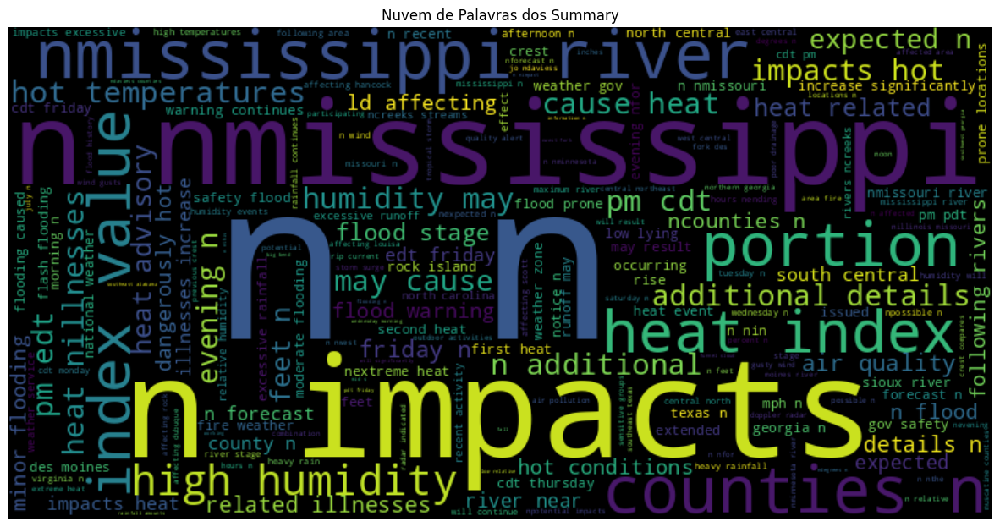

In [0]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Converter os títulos para texto (assumindo que pandas_df['title'] contém os títulos)
text = ' '.join(pandas_df['summary'])

# Remover números, converter para minúsculas e remover espaços adicionais
import re
text = re.sub(r'\d+', '', text)  # Remove números
text = re.sub(r'\s+', ' ', text)  # Remove espaços adicionais
text = text.lower()  # Converte para minúsculas

# Gerar a nuvem de palavras
wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text)

# Plotar a nuvem de palavras
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Nuvem de Palavras dos Summary')
plt.show()


In [0]:
# DataFrame para contagem de tipos de mensagem
msg_type_counts = pandas_df['cap:msgType'].value_counts().reset_index()
msg_type_counts.columns = ['Tipo de Mensagem', 'Contagem']

# Gráfico de contagem para tipos de mensagem com Plotly
fig = px.bar(
    msg_type_counts,
    x='Tipo de Mensagem',
    y='Contagem',
    labels={'Tipo de Mensagem': 'Tipo de Mensagem', 'Contagem': 'Contagem'},
    title='Contagem de Tipos de Mensagem',
    color='Tipo de Mensagem',  # Definir cor diferente para cada barra
    color_discrete_sequence=px.colors.qualitative.Plotly  # Escolher uma paleta de cores
)

# Atualizar o layout do gráfico
fig.update_layout(
    xaxis_title='Tipo de Mensagem',
    yaxis_title='Contagem',
    height=800,
    xaxis={'categoryorder':'total descending'}
)

# Mostrar o gráfico
fig.show()

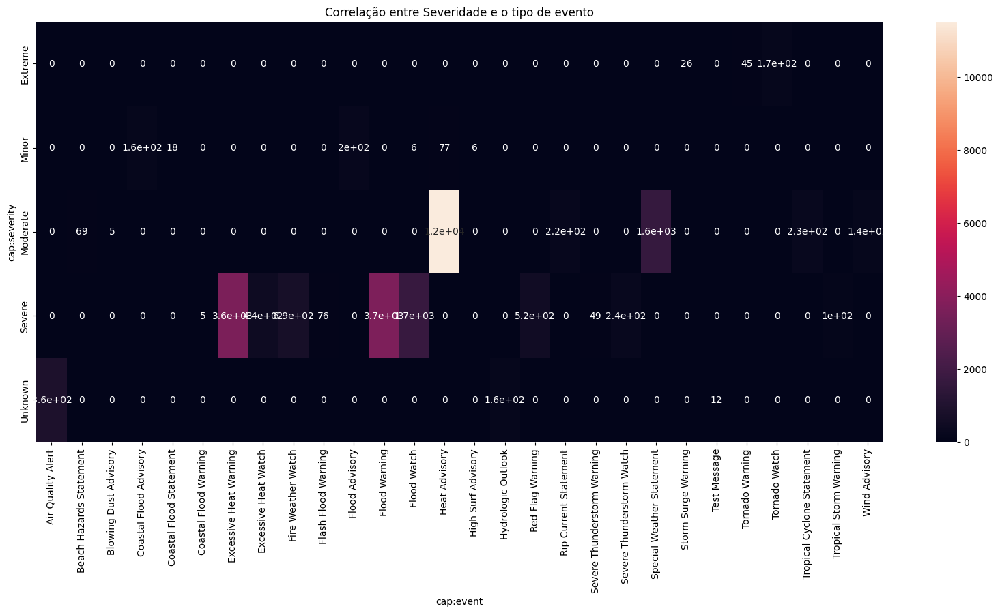

In [0]:
# Gráfico de calor para correlação entre severidade e urgência
severity_urgency = pd.crosstab(pandas_df['cap:severity'], pandas_df['cap:event'])
plt.figure(figsize=(20, 8))
sns.heatmap(severity_urgency, annot=True)
plt.title('Correlação entre Severidade e o tipo de evento')
plt.show()